In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install spatialdata spatialdata_plot spatialdata_io

In [1]:
!pip install -U typing_extensions

In [2]:
import pandas as pd
import spatialdata as sd
import spatialdata_plot
import cv2
import matplotlib.pyplot as plt
import seaborn as sns

## Download and load the data

In [3]:
from spatialdata_io import xenium, xenium_aligned_image

### Mouse Brain


In [ ]:
!wget https://cf.10xgenomics.com/samples/xenium/3.0.0/Xenium_Prime_Mouse_Brain_Coronal_FF/Xenium_Prime_Mouse_Brain_Coronal_FF_outs.zip

--2026-07-21 14:45:23--  https://cf.10xgenomics.com/samples/xenium/3.0.0/Xenium_Prime_Mouse_Brain_Coronal_FF/Xenium_Prime_Mouse_Brain_Coronal_FF_outs.zip
Resolving cf.10xgenomics.com (cf.10xgenomics.com)... 104.18.0.173, 104.18.1.173, 2606:4700::6812:1ad, ...
Connecting to cf.10xgenomics.com (cf.10xgenomics.com)|104.18.0.173|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13315451681 (12G) [application/zip]
Saving to: ‘Xenium_Prime_Mouse_Brain_Coronal_FF_outs.zip.2’

Xenium_Prime_Mouse_ 100%[===================>]  12.40G   178MB/s    in 88s     

2026-07-21 14:46:51 (145 MB/s) - ‘Xenium_Prime_Mouse_Brain_Coronal_FF_outs.zip.2’ saved [13315451681/13315451681]



In [ ]:
import zipfile

zip_path = "/content/Xenium_Prime_Mouse_Brain_Coronal_FF_outs.zip.1"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall("/content/extracted_folder")

In [ ]:
!wget -P /content/extracted_folder/he https://cf.10xgenomics.com/samples/xenium/3.0.0/Xenium_Prime_Mouse_Brain_Coronal_FF/Xenium_Prime_Mouse_Brain_Coronal_FF_he_image.ome.tif

--2026-07-21 14:51:40--  https://cf.10xgenomics.com/samples/xenium/3.0.0/Xenium_Prime_Mouse_Brain_Coronal_FF/Xenium_Prime_Mouse_Brain_Coronal_FF_he_image.ome.tif
Resolving cf.10xgenomics.com (cf.10xgenomics.com)... 104.18.0.173, 104.18.1.173, 2606:4700::6812:1ad, ...
Connecting to cf.10xgenomics.com (cf.10xgenomics.com)|104.18.0.173|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1059638081 (1011M) [image/tiff]
Saving to: ‘/content/extracted_folder/he/Xenium_Prime_Mouse_Brain_Coronal_FF_he_image.ome.tif’

Xenium_Prime_Mouse_ 100%[===================>]   1011M  31.8MB/s    in 35s     

2026-07-21 14:52:15 (29.0 MB/s) - ‘/content/extracted_folder/he/Xenium_Prime_Mouse_Brain_Coronal_FF_he_image.ome.tif’ saved [1059638081/1059638081]



In [ ]:
!wget -P /content/extracted_folder/he https://cf.10xgenomics.com/samples/xenium/3.0.0/Xenium_Prime_Mouse_Brain_Coronal_FF/Xenium_Prime_Mouse_Brain_Coronal_FF_he_imagealignment.csv

--2026-07-21 14:52:15--  https://cf.10xgenomics.com/samples/xenium/3.0.0/Xenium_Prime_Mouse_Brain_Coronal_FF/Xenium_Prime_Mouse_Brain_Coronal_FF_he_imagealignment.csv
Resolving cf.10xgenomics.com (cf.10xgenomics.com)... 104.18.0.173, 104.18.1.173, 2606:4700::6812:ad, ...
Connecting to cf.10xgenomics.com (cf.10xgenomics.com)|104.18.0.173|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 126 [text/csv]
Saving to: ‘/content/extracted_folder/he/Xenium_Prime_Mouse_Brain_Coronal_FF_he_imagealignment.csv’

Xenium_Prime_Mouse_ 100%[===================>]     126  --.-KB/s    in 0s      

2026-07-21 14:52:16 (49.6 MB/s) - ‘/content/extracted_folder/he/Xenium_Prime_Mouse_Brain_Coronal_FF_he_imagealignment.csv’ saved [126/126]



In [ ]:
from tifffile import TiffFile

with TiffFile('/content/extracted_folder/he/Xenium_Prime_Mouse_Brain_Coronal_FF_he_image.ome.tif') as tif:
    # Check OME-XML metadata
    ome_metadata = tif.ome_metadata

ome_metadata

'<?xml version="1.0" encoding="UTF-8" standalone="no"?><!-- Warning: this comment is an OME-XML metadata block, which contains crucial dimensional parameters and other important metadata. Please edit cautiously (if at all), and back up the original data before doing so. For more information, see the OME-TIFF web site: https://docs.openmicroscopy.org/latest/ome-model/ome-tiff/. --><OME xmlns="http://www.openmicroscopy.org/Schemas/OME/2016-06" xmlns:xsi="http://www.w3.org/2001/XMLSchema-instance" Creator="OME Bio-Formats 6.12.0" UUID="urn:uuid:f90c03eb-ad0c-4886-8ec3-18a9134fe44a" xsi:schemaLocation="http://www.openmicroscopy.org/Schemas/OME/2016-06 http://www.openmicroscopy.org/Schemas/OME/2016-06/ome.xsd"><Image ID="Image:0"><Pixels BigEndian="true" DimensionOrder="XYCZT" ID="Pixels:0" Interleaved="true" PhysicalSizeX="0.2737678272280392" PhysicalSizeXUnit="µm" PhysicalSizeY="0.27376783505006486" PhysicalSizeYUnit="µm" SizeC="3" SizeT="1" SizeX="17051" SizeY="24689" SizeZ="1" Type="uin

In [ ]:
path_read = "/content/extracted_folder"
#path_write = "/content/drive/MyDrive/Thesis/Projects/Data/Breast_Cancer/data.zarr"

In [ ]:
sdata = xenium(path_read, aligned_images=True)
#sdata.write(path_write, overwrite=True)

sdata

SpatialData object
├── Images
│     └── 'morphology_focus': DataTree[cyx] (4, 23912, 34154), (4, 11956, 17077), (4, 5978, 8538), (4, 2989, 4269), (4, 1494, 2134)
├── Labels
│     ├── 'cell_labels': DataTree[yx] (23912, 34154), (11956, 17077), (5978, 8538), (2989, 4269), (1494, 2134)
│     └── 'nucleus_labels': DataTree[yx] (23912, 34154), (11956, 17077), (5978, 8538), (2989, 4269), (1494, 2134)
├── Points
│     └── 'transcripts': DataFrame with shape: (12255123530, 13) (3D points)
├── Shapes
│     ├── 'cell_boundaries': GeoDataFrame shape: (63173, 1) (2D shapes)
│     └── 'nucleus_boundaries': GeoDataFrame shape: (63060, 2) (2D shapes)
└── Tables
      └── 'table': AnnData (63173, 5006)
with coordinate systems:
    ▸ 'global', with elements:
        morphology_focus (Images), cell_labels (Labels), nucleus_labels (Labels), transcripts (Points), cell_boundaries (Shapes), nucleus_boundaries (Shapes)

In [ ]:
image = xenium_aligned_image(
    image_path="/content/extracted_folder/he/Xenium_Prime_Mouse_Brain_Coronal_FF_he_image.ome.tif",
    alignment_file="/content/extracted_folder/he/Xenium_Prime_Mouse_Brain_Coronal_FF_he_imagealignment.csv",
    image_models_kwargs={
        "scale_factors": [
            {"y": 2, "x": 2},   # 0.5
            {"y": 2, "x": 2},   # 0.25
            {"y": 2, "x": 2},   # 0.125
            {"y": 2, "x": 2},   # 0.0625
            ]
    }
)

sdata.images["he_image"] = image

sdata

SpatialData object
├── Images
│     ├── 'he_image': DataTree[cyx] (3, 24689, 17051), (3, 12344, 8525), (3, 6172, 4262), (3, 3086, 2131), (3, 1543, 1065)
│     └── 'morphology_focus': DataTree[cyx] (4, 23912, 34154), (4, 11956, 17077), (4, 5978, 8538), (4, 2989, 4269), (4, 1494, 2134)
├── Labels
│     ├── 'cell_labels': DataTree[yx] (23912, 34154), (11956, 17077), (5978, 8538), (2989, 4269), (1494, 2134)
│     └── 'nucleus_labels': DataTree[yx] (23912, 34154), (11956, 17077), (5978, 8538), (2989, 4269), (1494, 2134)
├── Points
│     └── 'transcripts': DataFrame with shape: (12255123530, 13) (3D points)
├── Shapes
│     ├── 'cell_boundaries': GeoDataFrame shape: (63173, 1) (2D shapes)
│     └── 'nucleus_boundaries': GeoDataFrame shape: (63060, 2) (2D shapes)
└── Tables
      └── 'table': AnnData (63173, 5006)
with coordinate systems:
    ▸ 'global', with elements:
        he_image (Images), morphology_focus (Images), cell_labels (Labels), nucleus_labels (Labels), transcripts (Points), ce

### Breast Cancer


In [4]:
!wget https://cf.10xgenomics.com/samples/xenium/1.0.1/Xenium_FFPE_Human_Breast_Cancer_Rep1/Xenium_FFPE_Human_Breast_Cancer_Rep1_outs.zip

--2026-07-22 08:39:26--  https://cf.10xgenomics.com/samples/xenium/1.0.1/Xenium_FFPE_Human_Breast_Cancer_Rep1/Xenium_FFPE_Human_Breast_Cancer_Rep1_outs.zip
Resolving cf.10xgenomics.com (cf.10xgenomics.com)... 104.18.1.173, 104.18.0.173, 2606:4700::6812:1ad, ...
Connecting to cf.10xgenomics.com (cf.10xgenomics.com)|104.18.1.173|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 9861155708 (9.2G) [application/zip]
Saving to: ‘Xenium_FFPE_Human_Breast_Cancer_Rep1_outs.zip’

Xenium_FFPE_Human_B 100%[===================>]   9.18G   198MB/s    in 29s     

2026-07-22 08:39:56 (319 MB/s) - ‘Xenium_FFPE_Human_Breast_Cancer_Rep1_outs.zip’ saved [9861155708/9861155708]



In [5]:
import zipfile

zip_path = "/content/Xenium_FFPE_Human_Breast_Cancer_Rep1_outs.zip"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall("/content/extracted_folder")

In [6]:
!wget https://cf.10xgenomics.com/samples/xenium/1.0.1/Xenium_FFPE_Human_Breast_Cancer_Rep1/Xenium_FFPE_Human_Breast_Cancer_Rep1_he_image.ome.tif

--2026-07-22 08:41:24--  https://cf.10xgenomics.com/samples/xenium/1.0.1/Xenium_FFPE_Human_Breast_Cancer_Rep1/Xenium_FFPE_Human_Breast_Cancer_Rep1_he_image.ome.tif
Resolving cf.10xgenomics.com (cf.10xgenomics.com)... 104.18.1.173, 104.18.0.173, 2606:4700::6812:1ad, ...
Connecting to cf.10xgenomics.com (cf.10xgenomics.com)|104.18.1.173|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1427110955 (1.3G) [image/tiff]
Saving to: ‘Xenium_FFPE_Human_Breast_Cancer_Rep1_he_image.ome.tif’

Xenium_FFPE_Human_B 100%[===================>]   1.33G   227MB/s    in 11s     

2026-07-22 08:41:35 (126 MB/s) - ‘Xenium_FFPE_Human_Breast_Cancer_Rep1_he_image.ome.tif’ saved [1427110955/1427110955]



In [7]:
!wget https://cf.10xgenomics.com/samples/xenium/1.0.1/Xenium_FFPE_Human_Breast_Cancer_Rep1/Xenium_FFPE_Human_Breast_Cancer_Rep1_he_imagealignment.csv

--2026-07-22 08:41:35--  https://cf.10xgenomics.com/samples/xenium/1.0.1/Xenium_FFPE_Human_Breast_Cancer_Rep1/Xenium_FFPE_Human_Breast_Cancer_Rep1_he_imagealignment.csv
Resolving cf.10xgenomics.com (cf.10xgenomics.com)... 104.18.1.173, 104.18.0.173, 2606:4700::6812:1ad, ...
Connecting to cf.10xgenomics.com (cf.10xgenomics.com)|104.18.1.173|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 126 [text/csv]
Saving to: ‘Xenium_FFPE_Human_Breast_Cancer_Rep1_he_imagealignment.csv’

Xenium_FFPE_Human_B 100%[===================>]     126  --.-KB/s    in 0s      

2026-07-22 08:41:35 (114 MB/s) - ‘Xenium_FFPE_Human_Breast_Cancer_Rep1_he_imagealignment.csv’ saved [126/126]



In [8]:
from tifffile import TiffFile

with TiffFile('/content/Xenium_FFPE_Human_Breast_Cancer_Rep1_he_image.ome.tif') as tif:
    # Check OME-XML metadata
    ome_metadata = tif.ome_metadata

ome_metadata

'<?xml version="1.0" encoding="UTF-8" standalone="no"?><!-- Warning: this comment is an OME-XML metadata block, which contains crucial dimensional parameters and other important metadata. Please edit cautiously (if at all), and back up the original data before doing so. For more information, see the OME-TIFF web site: https://docs.openmicroscopy.org/latest/ome-model/ome-tiff/. --><OME xmlns="http://www.openmicroscopy.org/Schemas/OME/2016-06" xmlns:xsi="http://www.w3.org/2001/XMLSchema-instance" Creator="OME Bio-Formats 6.7.0" UUID="urn:uuid:af657845-f0b8-475f-9b7d-6f3a0d0aab2b" xsi:schemaLocation="http://www.openmicroscopy.org/Schemas/OME/2016-06 http://www.openmicroscopy.org/Schemas/OME/2016-06/ome.xsd"><Image ID="Image:0"><Pixels BigEndian="true" DimensionOrder="XYCZT" ID="Pixels:0" Interleaved="true" PhysicalSizeX="0.363788" PhysicalSizeXUnit="µm" PhysicalSizeY="0.363788" PhysicalSizeYUnit="µm" SizeC="3" SizeT="1" SizeX="30786" SizeY="24241" SizeZ="1" Type="uint8"><Channel ID="Chann

In [9]:
path_read = "/content/extracted_folder/outs"
#path_write = "/content/drive/MyDrive/Thesis/Projects/Data/Breast_Cancer/data.zarr"

In [10]:
sdata = xenium(path_read, aligned_images=True)
#sdata.write(path_write, overwrite=True)

sdata

SpatialData object
├── Images
│     ├── 'morphology_focus': DataTree[cyx] (1, 25778, 35416), (1, 12889, 17708), (1, 6444, 8854), (1, 3222, 4427), (1, 1611, 2213)
│     └── 'morphology_mip': DataTree[cyx] (1, 25778, 35416), (1, 12889, 17708), (1, 6444, 8854), (1, 3222, 4427), (1, 1611, 2213)
├── Labels
│     ├── 'cell_labels': DataTree[yx] (25778, 35416), (12889, 17708), (6444, 8854), (3222, 4427), (1611, 2213)
│     └── 'nucleus_labels': DataTree[yx] (25778, 35416), (12889, 17708), (6444, 8854), (3222, 4427), (1611, 2213)
├── Points
│     └── 'transcripts': DataFrame with shape: (8000000, 8) (3D points)
├── Shapes
│     ├── 'cell_boundaries': GeoDataFrame shape: (167780, 1) (2D shapes)
│     └── 'nucleus_boundaries': GeoDataFrame shape: (167780, 1) (2D shapes)
└── Tables
      └── 'table': AnnData (167780, 313)
with coordinate systems:
    ▸ 'global', with elements:
        morphology_focus (Images), morphology_mip (Images), cell_labels (Labels), nucleus_labels (Labels), transcripts (P

In [11]:
image = xenium_aligned_image(
    image_path="/content/Xenium_FFPE_Human_Breast_Cancer_Rep1_he_image.ome.tif",
    alignment_file="/content/Xenium_FFPE_Human_Breast_Cancer_Rep1_he_imagealignment.csv",
    image_models_kwargs={
        "scale_factors": [
            {"y": 2, "x": 2},   # 0.5
            {"y": 2, "x": 2},   # 0.25
            {"y": 2, "x": 2},   # 0.125
            {"y": 2, "x": 2},   # 0.0625
            ]
    }
)

sdata.images["he_image"] = image

sdata

SpatialData object
├── Images
│     ├── 'he_image': DataTree[cyx] (3, 24241, 30786), (3, 12120, 15393), (3, 6060, 7696), (3, 3030, 3848), (3, 1515, 1924)
│     ├── 'morphology_focus': DataTree[cyx] (1, 25778, 35416), (1, 12889, 17708), (1, 6444, 8854), (1, 3222, 4427), (1, 1611, 2213)
│     └── 'morphology_mip': DataTree[cyx] (1, 25778, 35416), (1, 12889, 17708), (1, 6444, 8854), (1, 3222, 4427), (1, 1611, 2213)
├── Labels
│     ├── 'cell_labels': DataTree[yx] (25778, 35416), (12889, 17708), (6444, 8854), (3222, 4427), (1611, 2213)
│     └── 'nucleus_labels': DataTree[yx] (25778, 35416), (12889, 17708), (6444, 8854), (3222, 4427), (1611, 2213)
├── Points
│     └── 'transcripts': DataFrame with shape: (8000000, 8) (3D points)
├── Shapes
│     ├── 'cell_boundaries': GeoDataFrame shape: (167780, 1) (2D shapes)
│     └── 'nucleus_boundaries': GeoDataFrame shape: (167780, 1) (2D shapes)
└── Tables
      └── 'table': AnnData (167780, 313)
with coordinate systems:
    ▸ 'global', with element

In [12]:
!wget https://cf.10xgenomics.com/samples/xenium/1.0.1/Xenium_FFPE_Human_Breast_Cancer_Rep1/Xenium_FFPE_Human_Breast_Cancer_Rep1_if_image.ome.tif

--2026-07-22 08:41:46--  https://cf.10xgenomics.com/samples/xenium/1.0.1/Xenium_FFPE_Human_Breast_Cancer_Rep1/Xenium_FFPE_Human_Breast_Cancer_Rep1_if_image.ome.tif
Resolving cf.10xgenomics.com (cf.10xgenomics.com)... 104.18.1.173, 104.18.0.173, 2606:4700::6812:1ad, ...
Connecting to cf.10xgenomics.com (cf.10xgenomics.com)|104.18.1.173|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 63643728 (61M) [image/tiff]
Saving to: ‘Xenium_FFPE_Human_Breast_Cancer_Rep1_if_image.ome.tif’

Xenium_FFPE_Human_B 100%[===================>]  60.70M  25.7MB/s    in 2.4s    

2026-07-22 08:41:49 (25.7 MB/s) - ‘Xenium_FFPE_Human_Breast_Cancer_Rep1_if_image.ome.tif’ saved [63643728/63643728]



In [13]:
!wget https://cf.10xgenomics.com/samples/xenium/1.0.1/Xenium_FFPE_Human_Breast_Cancer_Rep1/Xenium_FFPE_Human_Breast_Cancer_Rep1_if_imagealignment.csv

--2026-07-22 08:41:49--  https://cf.10xgenomics.com/samples/xenium/1.0.1/Xenium_FFPE_Human_Breast_Cancer_Rep1/Xenium_FFPE_Human_Breast_Cancer_Rep1_if_imagealignment.csv
Resolving cf.10xgenomics.com (cf.10xgenomics.com)... 104.18.1.173, 104.18.0.173, 2606:4700::6812:1ad, ...
Connecting to cf.10xgenomics.com (cf.10xgenomics.com)|104.18.1.173|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 125 [text/csv]
Saving to: ‘Xenium_FFPE_Human_Breast_Cancer_Rep1_if_imagealignment.csv’

Xenium_FFPE_Human_B 100%[===================>]     125  --.-KB/s    in 0s      

2026-07-22 08:41:49 (66.6 MB/s) - ‘Xenium_FFPE_Human_Breast_Cancer_Rep1_if_imagealignment.csv’ saved [125/125]



In [14]:
image = xenium_aligned_image(
    image_path="/content/Xenium_FFPE_Human_Breast_Cancer_Rep1_if_image.ome.tif",
    alignment_file="/content/Xenium_FFPE_Human_Breast_Cancer_Rep1_if_imagealignment.csv",
    image_models_kwargs={
        "scale_factors": [
            {"y": 2, "x": 2},   # 0.5
            {"y": 2, "x": 2},   # 0.25
            {"y": 2, "x": 2},   # 0.125
            {"y": 2, "x": 2},   # 0.0625
            ]
    }
)

sdata.images["if_image"] = image

sdata

SpatialData object
├── Images
│     ├── 'he_image': DataTree[cyx] (3, 24241, 30786), (3, 12120, 15393), (3, 6060, 7696), (3, 3030, 3848), (3, 1515, 1924)
│     ├── 'if_image': DataTree[cyx] (3, 9777, 14239), (3, 4888, 7119), (3, 2444, 3559), (3, 1222, 1779), (3, 611, 889)
│     ├── 'morphology_focus': DataTree[cyx] (1, 25778, 35416), (1, 12889, 17708), (1, 6444, 8854), (1, 3222, 4427), (1, 1611, 2213)
│     └── 'morphology_mip': DataTree[cyx] (1, 25778, 35416), (1, 12889, 17708), (1, 6444, 8854), (1, 3222, 4427), (1, 1611, 2213)
├── Labels
│     ├── 'cell_labels': DataTree[yx] (25778, 35416), (12889, 17708), (6444, 8854), (3222, 4427), (1611, 2213)
│     └── 'nucleus_labels': DataTree[yx] (25778, 35416), (12889, 17708), (6444, 8854), (3222, 4427), (1611, 2213)
├── Points
│     └── 'transcripts': DataFrame with shape: (8000000, 8) (3D points)
├── Shapes
│     ├── 'cell_boundaries': GeoDataFrame shape: (167780, 1) (2D shapes)
│     └── 'nucleus_boundaries': GeoDataFrame shape: (167780, 1

## Read from .zarr file

In [ ]:
#path = "/content/drive/MyDrive/Thesis/Projects/Data/Mouse_Brain_Coronal/data.zarr"
#path = "G:/My Drive/Thesis/Projects/Data/Mouse_Brain_Xenium/data.zarr"
#path = "/content/drive/MyDrive/Thesis/Projects/Data/Mouse_Brain/Napari/ann_data.zarr"
path = "/content/drive/MyDrive/Thesis/Projects/Data/Breast_Cancer/ann_data.zarr"
#path = "G:/My Drive/Thesis/Projects/Data/Breast_Cancer/ann_data.zarr"
sdata = sd.read_zarr(path)
#sdata

In [ ]:
# For breast cancer dataset, we have also the labels for cell_types

cell_anno_path = "G:/My Drive/Thesis/Projects/Data/Breast_Cancer/Cell_Barcode_Type_Matrices.xlsx"

df = pd.read_excel(cell_anno_path,
                   sheet_name="Xenium R1 Fig1-5 (supervised)"
                   )

sdata['table'].obs["cell_type"] = (
    sdata['table'].obs["cell_id"]
    .map(df.set_index("Barcode")["Cluster"])
)

## Exploring the dataset

In [ ]:
### to see the available functions
dir(sdata)
help(sdata)

In [ ]:
adata = sdata.tables['table']
adata

In [ ]:
adata.X[15,:100].toarray()

---

**Column explanations**

---





1.   **cell_id:**
A unique identifier for each segmented cell in the dataset.

2.   **transcript_counts:**
The total number of valid gene transcripts detected and assigned to this cell.

3.   **control_probe_counts:**
The number of transcripts detected from control probes.

    
> These probes are not real genes; they are synthetic controls used to check for background signal, assay performance, or nonspecific binding.



4.  **control_codeword_counts:**
Counts of control “codewords” (signal patterns that don't correspond to real genes).



> This is used for calibration and error checking of the Xenium decoding pipeline.


5.  **unassigned_codeword_counts:**
Number of detected fluorescent signals (“codewords”) that could not be matched to any gene, control probe, or control codeword.

>Typically background noise, optical artifacts, or imperfect probe binding.

6.  **total_counts:**
The sum of all transcript-like signals detected in the cell:
transcript_counts + control_probe_counts + control_codeword_counts + unassigned_codeword_counts + deprecated_codeword_counts.

7.  **cell_area:**
The area (in square microns) of the segmented cell, based on the Xenium cell segmentation mask.

8.  **nucleus_area**
The area (in square microns) of the nucleus inside that cell, also from segmentation.

9.  **region:**
Which tissue region the cell belongs to, if regions were annotated (e.g., tumor vs stroma, cortex vs hippocampus).

10.  **cell_labels:**
The assigned cell type label (if clustering or annotation has been performed).

In [ ]:
###Histograms
fig, axs = plt.subplots(1, 3, figsize=(15, 4))

axs[0].set_title("Total transcripts per cell")
sns.histplot(
    adata.obs["total_counts"],
    kde=False,
    ax=axs[0],
)


axs[1].set_title("Area of segmented cells")
sns.histplot(
    adata.obs["cell_area"],
    kde=False,
    ax=axs[1],
)

axs[2].set_title("Nucleus ratio")
sns.histplot(
    adata.obs["nucleus_area"] / adata.obs["cell_area"],
    kde=False,
    ax=axs[2],
)

## Images (spatial data library)

### Mouse Brain

The datasets contains 2 large microscopy image, represented as a multiscale, chunked image; the first one, ***he_image*** is the **H&E image** of the tissue, stained post-Xenium measurement, and the ***morphology_focus*** image which consists of the **image of the tissue** used for the Xenium experiment.


/usr/local/lib/python3.12/dist-packages/pims/tiff_stack.py:131: UserWarning: <tifffile.TiffPage 0 @16> reading array from closed file
  data = t.asarray()


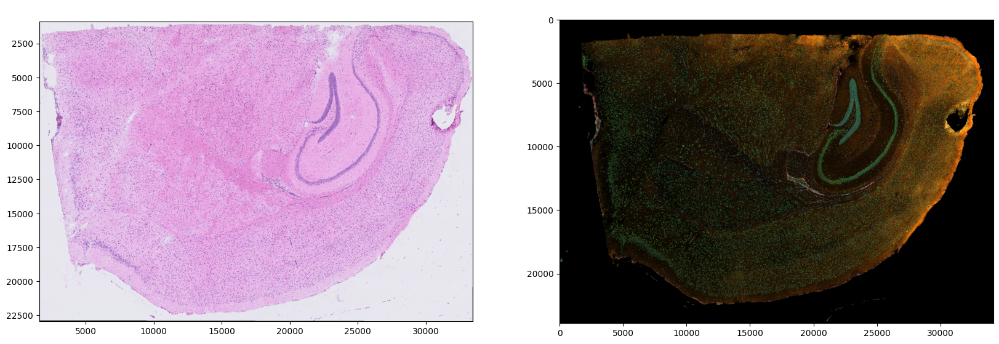

In [ ]:
### Ploting the morphology images inside the dataset
axes = plt.subplots(1, 2, figsize=(20, 12))[1].flatten()
sdata.pl.render_images("he_image").pl.show(ax=axes[0], title=" ", colorbar=False, save='/content/MB_HE.pdf')
sdata.pl.render_images("morphology_focus").pl.show(ax=axes[1], title=" ", colorbar=False, save='/content/MB_morpho_focous.pdf')
#sdata.pl.render_images("morphology_mip").pl.show(ax=axes[1], title="Morphology mip", colorbar=False)

Furthermore, it also contains label images, that are the segmentation masks of cells or nuclei (cell_labels and nucleus_labels respectively).

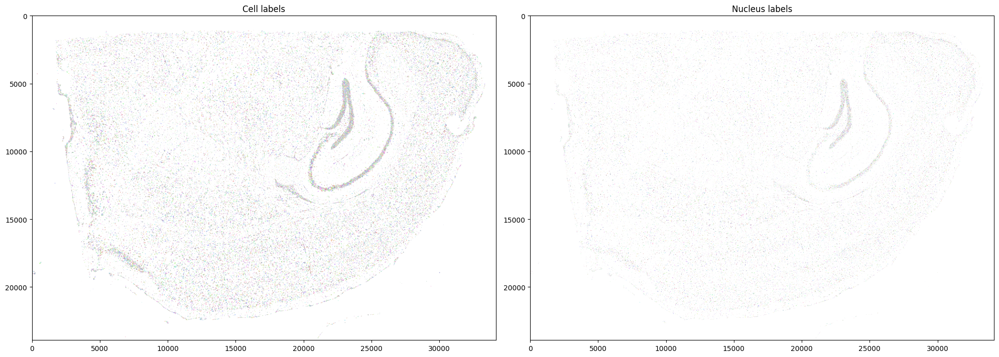

In [ ]:
axs = plt.subplots(1, 2, figsize=(20, 12))[1].flatten()

#cell label image
sdata.pl.render_labels("cell_labels").pl.show(ax=axs[0], title="Cell labels", colorbar=False)


#nucleus label image
sdata.pl.render_labels("nucleus_labels").pl.show(ax=axs[1], title="Nucleus labels", colorbar=False)

plt.tight_layout()
plt.show()

### Breast Cancer

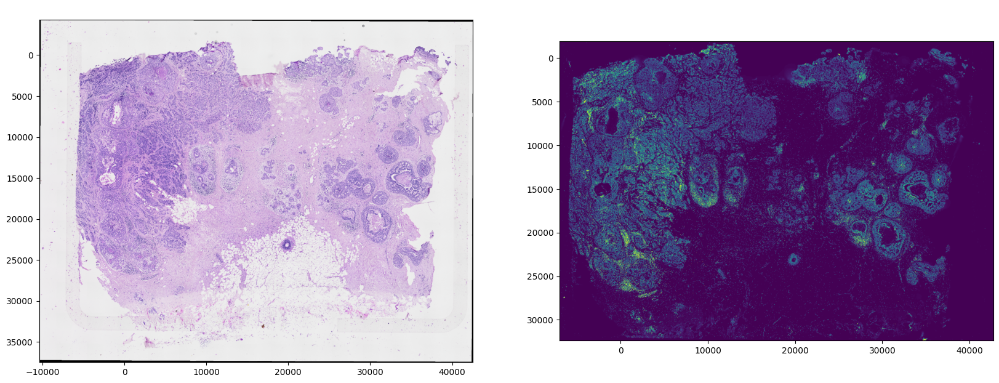

In [ ]:
### Ploting the morphology images inside the dataset
axes = plt.subplots(1, 2, figsize=(20, 12))[1].flatten()
sdata.pl.render_images("he_image").pl.show(
    ax=axes[0], title=" ", colorbar=False,
    )
sdata.pl.render_images("if_image", channel=2).pl.show(
    ax=axes[1], title=" ", colorbar=False,
    save='/content/BC_images.pdf'
    )
#sdata.pl.render_images("morphology_mip").pl.show(ax=axes[1], title="Morphology mip", colorbar=False)

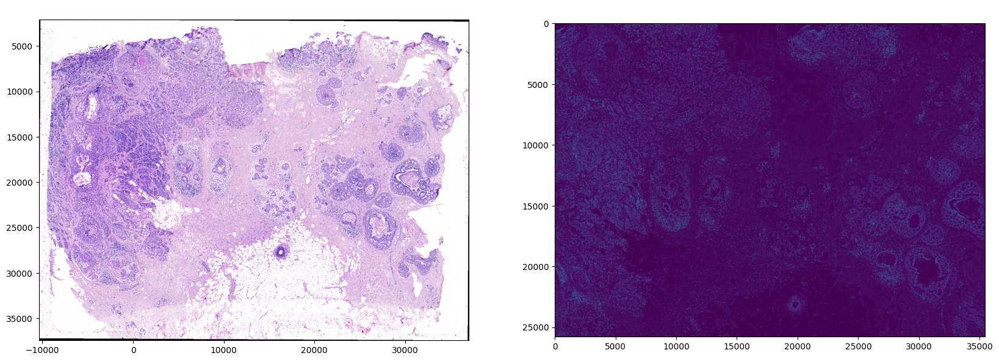

In [ ]:
### Ploting the morphology images inside the dataset
axes = plt.subplots(1, 2, figsize=(20, 12))[1].flatten()
sdata.pl.render_images("he_image").pl.show(ax=axes[0], title=" ", colorbar=False)
#sdata.pl.render_images("morphology_focus").pl.show(ax=axes[1], title=" ", colorbar=False, save='/content/MB_morpho_focous.pdf')
sdata.pl.render_images("morphology_mip").pl.show(ax=axes[1], title="Morphology mip", colorbar=False)

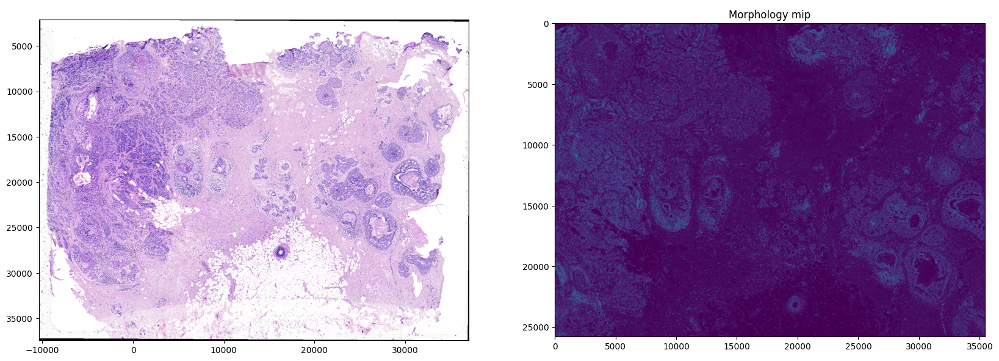

In [ ]:
### Ploting the morphology images inside the dataset
axes = plt.subplots(1, 2, figsize=(20, 12))[1].flatten()
sdata.pl.render_images("he_image").pl.show(ax=axes[0], title=" ", colorbar=False)
#sdata.pl.render_images("morphology_focus").pl.show(ax=axes[1], title=" ", colorbar=False, save='/content/MB_morpho_focous.pdf')
sdata.pl.render_images("morphology_mip").pl.show(ax=axes[1], title="Morphology mip", colorbar=False)

## Find the center of a cell and crop the surrounding

In [15]:
import spatialdata as sd
from spatialdata import bounding_box_query
import matplotlib.pyplot as plt
import numpy as np

import os

In [16]:
# Transform the cell boundaries to global coordinates
navi = sd.transform(
    sdata,
    to_coordinate_system="global"
)


# --- 1. Load your SpatialData object (already have `sdata`) ---
# sdata = sd.read_zarr("/content/drive/MyDrive/Thesis/Projects/Data/Breast_Cancer/ann_data.zarr")

# --- 2. Pick a cell and get its centroid ---
table = sdata["table"]
cell_center = navi.shapes['cell_boundaries'].centroid[18328]
# Get cell center (yx format for plotting)
cx, cy = cell_center.x, cell_center.y

# --- 3. Define a bounding box patch around the cell (in 'global' coords) ---
patch_size = 356  # microns/pixels depending on your coordinate system units
min_x, max_x = cx - patch_size / 2, cx + patch_size / 2
min_y, max_y = cy - patch_size / 2, cy + patch_size / 2

cropped = bounding_box_query(
    navi,
    axes=("x", "y"),
    min_coordinate=[min_x, min_y],
    max_coordinate=[max_x, max_y],
    target_coordinate_system="global",
)


/usr/local/lib/python3.12/dist-packages/spatialdata/models/models.py:399: UserWarning: Detected chunks larger than: 2238850278 > 2147483647 bytes. This can lead to low performance and memory issues downstream, and sometimes cause compression errors when writing (https://github.com/scverse/spatialdata/issues/812#issuecomment-2575983527). Please consider using 1) smaller chunks and/or 2) using a multiscale representation for the raster data.
1) Smaller chunks can be achieved by using the `chunks` argument in the `parse()` function or by calling the `chunk()` method on `DataArray`/`DataTree` objects.
2) Multiscale representations can be achieved by using the `scale_factors` argument in the `parse()` function.
You can suppress this warning by increasing the value of `spatialdata.settings.large_chunk_threshold_bytes`.
  cls._check_chunk_size_not_too_large(data[d][name])
/usr/local/lib/python3.12/dist-packages/spatialdata/models/models.py:399: UserWarning: Detected chunks larger than: 365181

In [17]:
# --- 4. Pull out the cropped HE image and cell boundaries ---
he_cropped = cropped["he_image"]["scale0"]["image"]  # highest-res scale in the DataTree
he_arr = he_cropped.transpose("y", "x", "c").values  # cyx -> yxc for plotting
# normalize if needed
if he_arr.dtype != np.uint8:
    he_arr = (he_arr / he_arr.max() * 255).astype(np.uint8)

cell_boundaries_cropped = cropped["cell_boundaries"]



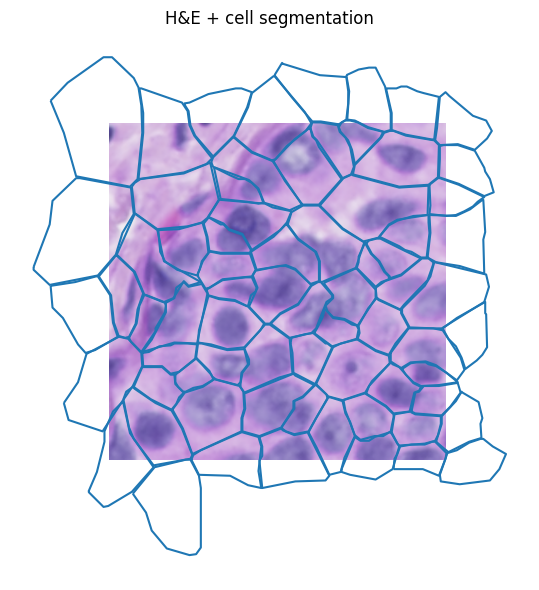

In [18]:
# --- 5. Plot HE image with cell segmentation boundaries overlaid ---
fig, axes = plt.subplots(1, 1, figsize=(12, 6))

axes.imshow(he_arr, extent=(min_x, max_x, max_y, min_y))
#cell_boundaries_cropped.boundary.plot(ax=axes, edgecolor="lime", linewidth=1)
cell_boundaries_cropped.boundary.plot(ax=axes)
axes.set_title("H&E + cell segmentation")
axes.axis("off")
plt.tight_layout()
plt.show()
fig.savefig(f"breast_cancer_cell_{18328}.pdf")

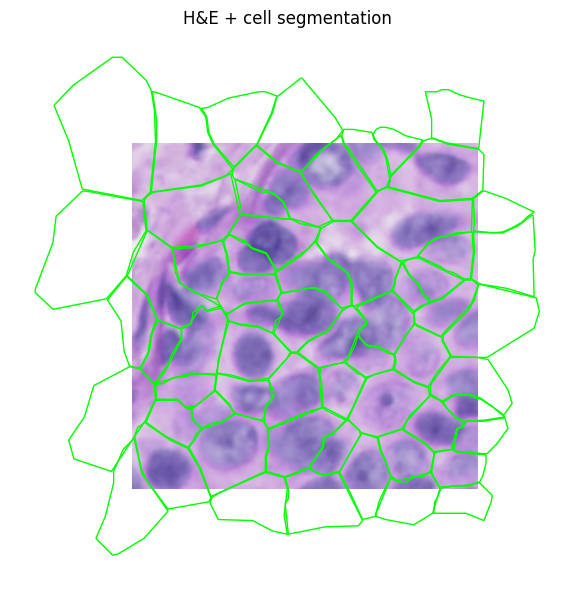

In [ ]:
# --- 5. Plot HE image with cell segmentation boundaries overlaid ---
fig, axes = plt.subplots(1, 1, figsize=(12, 6))

axes.imshow(he_arr, extent=(min_x, max_x, max_y, min_y))
#cell_boundaries_cropped.boundary.plot(ax=axes, edgecolor="lime", linewidth=1)
cell_boundaries_cropped.boundary.plot(ax=axes)
axes.set_title("H&E + cell segmentation")
axes.axis("off")
plt.tight_layout()
plt.show()
fig.savefig(f"breast_cancer_cell_{18328}.pdf")

In [ ]:
from spatialdata import get_extent

img = sdata.images['he_image']
# Get the cropped H&E image (already aligned)
he = sd.transform(img, to_coordinate_system="global")
he_m = he['scale0'].image.data.compute()
extent = get_extent(he)

y_s,y_e = extent['y']
x_s,x_e = extent['x']

print('X_start: ', x_s)
print('y_start: ', y_s)

/usr/local/lib/python3.12/dist-packages/spatialdata/models/models.py:399: UserWarning: Detected chunks larger than: 2238850278 > 2147483647 bytes. This can lead to low performance and memory issues downstream, and sometimes cause compression errors when writing (https://github.com/scverse/spatialdata/issues/812#issuecomment-2575983527). Please consider using 1) smaller chunks and/or 2) using a multiscale representation for the raster data.
1) Smaller chunks can be achieved by using the `chunks` argument in the `parse()` function or by calling the `chunk()` method on `DataArray`/`DataTree` objects.
2) Multiscale representations can be achieved by using the `scale_factors` argument in the `parse()` function.
You can suppress this warning by increasing the value of `spatialdata.settings.large_chunk_threshold_bytes`.
  cls._check_chunk_size_not_too_large(data[d][name])


X_start:  -10397.19948741904
y_start:  -4301.199182561511


In [ ]:

path = "/content/cells"
os.makedirs(path, exist_ok=True)

#ind = sdata.tables['table'].obs.index[100]
#id = sdata.tables['table'].obs['cell_id'][int(ind)]
#id = sdata.tables['table'].obs.index[1001]


In [ ]:
sdata.tables['table'][sdata.tables['table'].obs['cell_type'] == 'Invasive_Tumor'].obs.index[3899]

'18328'

In [ ]:
#cell_center = navi.centroid[id]
cell_center = navi.centroid[18328]
# Get cell center (yx format for plotting)
x, y = cell_center.x, cell_center.y

# Define crop size
half_size = 70/0.363788
xmin, xmax = x - half_size, x + half_size
ymin, ymax = y - half_size, y + half_size

c_img = he_m[:, int(ymin-y_s):int(ymax-y_s), int(xmin-x_s):int(xmax-x_s)]

## Convert to numpy
he_crop_array = c_img
normalized_he = he_crop_array.transpose(1, 2, 0)  # (cyx) → (yx, x, c)

plt.imsave(os.path.join(path, f"{id}.png"), normalized_he)

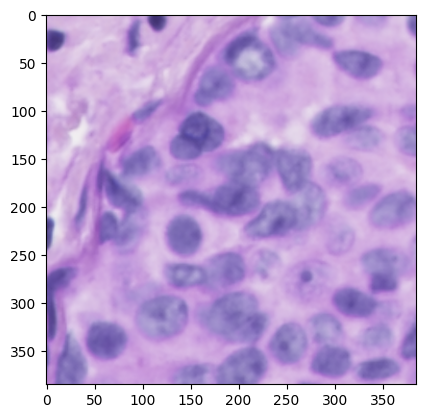

In [ ]:
img = plt.imread(os.path.join(path, f"{id}.png"))
plt.imshow(img)

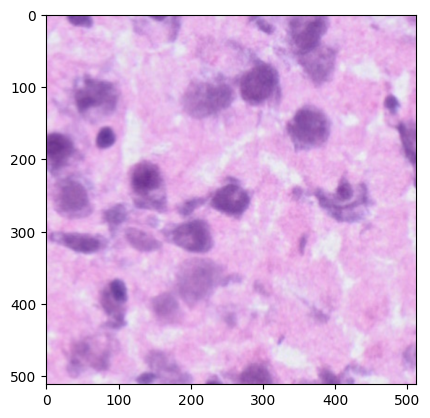

In [ ]:
img = plt.imread(os.path.join(path, f"{id}.png"))
plt.imshow(img)

## Annotating the ROIs

In [ ]:
!pip install napari
!pip install napari-spatialdata

In [ ]:
from napari_spatialdata import Interactive
from spatialdata import polygon_query
import anndata as ad
from collections import defaultdict
from tqdm import tqdm


In [ ]:
interactive = Interactive(sdata)
interactive.run()

(np.float64(-0.5), np.float64(1919.5), np.float64(1008.5), np.float64(-0.5))

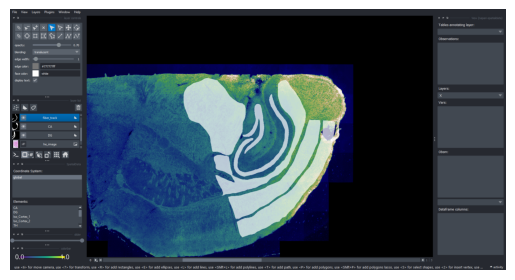

In [ ]:
plt.imshow(interactive.screenshot())
plt.axis('off')

In [ ]:
sdata

SpatialData object, with associated Zarr store: /content/drive/MyDrive/Thesis/Projects/Data/Mouse_Brain/Napari/ann_data.zarr
├── Images
│     ├── 'he_image': DataTree[cyx] (3, 24689, 17051), (3, 12344, 8525), (3, 6172, 4262), (3, 3086, 2131), (3, 1543, 1065)
│     └── 'morphology_focus': DataTree[cyx] (4, 23912, 34154), (4, 11956, 17077), (4, 5978, 8538), (4, 2989, 4269), (4, 1494, 2134)
├── Labels
│     ├── 'cell_labels': DataTree[yx] (23912, 34154), (11956, 17077), (5978, 8538), (2989, 4269), (1494, 2134)
│     └── 'nucleus_labels': DataTree[yx] (23912, 34154), (11956, 17077), (5978, 8538), (2989, 4269), (1494, 2134)
├── Points
│     └── 'transcripts': DataFrame with shape: (188540362, 13) (3D points)
├── Shapes
│     ├── 'CA': GeoDataFrame shape: (1, 1) (2D shapes)
│     ├── 'DG': GeoDataFrame shape: (1, 1) (2D shapes)
│     ├── 'Iso_Cortex_1': GeoDataFrame shape: (1, 1) (2D shapes)
│     ├── 'Iso_Cortex_2': GeoDataFrame shape: (1, 1) (2D shapes)
│     ├── 'TH': GeoDataFrame shape: 

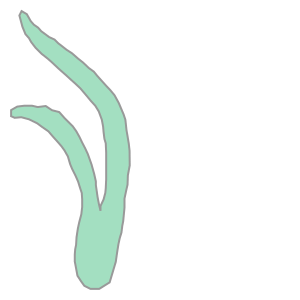

In [ ]:
sdata.shapes['DG'].geometry.iloc[0]

In [ ]:
ann_path = "C:/Users/User/Desktop/Xenium Data/Mouse_Brain/ann_data.zarr"
sdata.write(ann_path, overwrite=True)

In [ ]:
del sdata.images['he_image']
del sdata.images['morphology_focus']
del sdata.points['transcripts']

In [ ]:

filtered_tables_unmerged: dict[str, list[ad.AnnData]] = defaultdict(list)
filtered_tables: dict[str, ad.AnnData] = {}

#for shape in tqdm(['DCIS_1', 'DCIS_2', 'Invasive']):
for shape in tqdm(['CA', 'DG', 'Iso_Cortex_1', 'Iso_Cortex_2', 'TH', 'fiber_track']):
    for polygon in sdata[shape].geometry:
        table = polygon_query(sdata, polygon=polygon, target_coordinate_system="global")["table"]
        filtered_tables_unmerged[shape].append(table)
    filtered_tables[shape] = ad.concat(filtered_tables_unmerged[shape])

100%|██████████| 6/6 [01:02<00:00, 10.40s/it]


In [ ]:
filtered_tables

In [ ]:
assert sdata["table"].obs.index.is_unique

In [ ]:
categories = ["unassigned"] + list(filtered_tables.keys())
n = len(sdata["table"])


ad.obs["annotation"] = pd.Categorical(["unassigned" for _ in range(n)], categories=categories)
ad = sdata["table"].copy()
for shape, subtable in filtered_tables.items():
    in_shape = subtable.obs.index
    ad.obs.loc[in_shape, "annotation"] = shape

ad.obs["annotation"].value_counts()

annotation
unassigned      44525
Iso_Cortex_2     4289
TH               3703
CA               3425
Iso_Cortex_1     3420
DG               1992
fiber_track      1819
Name: count, dtype: int64

/usr/local/lib/python3.12/dist-packages/squidpy/pl/_spatial_utils.py:468: FutureWarning: The method obs_vector is deprecated and will be removed in the future. Use anndata.acc.A instead of obs_vector. E.g. `vec = adata[A.obs['foo']]` or `vec = adata[A.layers['l']['bar', :]]`
  color_source_vector = adata.obs_vector(value_to_plot, layer=layer)
/usr/local/lib/python3.12/dist-packages/squidpy/pl/_spatial_utils.py:979: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


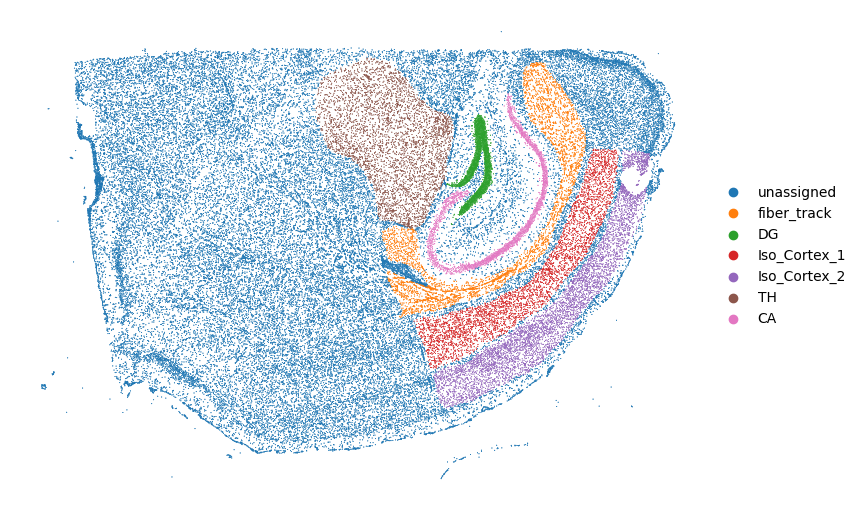

In [ ]:
import squidpy as sq

sq.pl.spatial_scatter(
    ad, color=['annotation'], title = '', shape=None, figsize=(10, 5),
    ncols=2, legend_loc="right margin", frameon=False, size=2., lw=0., wspace=0.0,
    hspace=0.0
    )

In [ ]:
ann_data_path = "/content/drive/MyDrive/Thesis/Projects/Data/Mouse_Brain/anndata.h5ad"
ad.write(ann_data_path)